<a href="https://colab.research.google.com/github/Y4S1-Deep-Learning/Leaf-Desease-Detection---Supervised-Learning/blob/thisara/Faster_R_CNN_with_Detectron2%20updated.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install Detectron2 Dependencies

In [ ]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==2.0.0 torchvision -f https://download.pytorch.org/whl/cu101/torch_stable.html
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 619.9/619.9 MB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 84.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.0/21.0 MB 66.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 849.3/849.3 kB 70.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 92.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 557.1/557.1 MB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.1/317.1 MB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.4/168.4 MB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.6/54.6 MB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.6/102.6 MB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 173.2/173.2 MB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# install detectron2:
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-up996mg_
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-up996mg_
  Resolved https://github.com/facebookresearch/detectron2.git to commit 4e80df1e58901557e2824ce3b488d30209a9be33
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 4.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 10.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2-0.6-

In [ ]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

# Import and Register Custom Detectron2 Data

In [ ]:
!curl -L "https://app.roboflow.com/ds/TxTz3KHSof?key=mPgWwkRWo9" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   892  100   892    0     0   2394      0 --:--:-- --:--:-- --:--:--  2397
100 16.4M  100 16.4M    0     0  16.8M      0 --:--:-- --:--:-- --:--:-- 40.9M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/0000_jpg.rf.8822fca7b538aff733a2ecaa6a1e0d04.jpg  
 extracting: test/003_JPG_jpg.rf.a82832520483d8461c8912457450ba86.jpg  
 extracting: test/009-e1373768789869_jpg.rf.67ac892a7e13913863759837c1202a1d.jpg  
 extracting: test/00pe_jpg.rf.22be39f0803173d14264e38dce2db66b.jpg  
 extracting: test/02_-Rust-2017-207u24s_jpg.rf.0e93e1094d4e3b7d2365903e0d331af7.jpg  
 extracting: test/05-069f12_jpg.rf.530b648a59abd848c17d2c78c6eb6294.jpg  
 extracting: test/0796_33anthracn_jpg.rf.21fca88881d08764733825cc86ac79f6.jpg  
 extracting: test/0805Fig3400_jpg

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


WARNING [10/06 21:01:13 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/06 21:01:13 d2.data.datasets.coco]: Loaded 3432 images in COCO format from /content/train/_annotations.coco.json


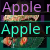

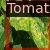

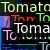

In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Train Custom Detectron2 Detector

In [ ]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 2500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (3000, 4000)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 31 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[10/06 21:01:17 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
model_final_68b088.pkl: 421MB [00:03, 111MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[10/06 21:01:22 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[10/06 21:02:12 d2.utils.events]:  eta: 1:13:21  iter: 19  total_loss: 4.313  loss_cls: 3.345  loss_box_reg: 0.837  loss_rpn_cls: 0.1054  loss_rpn_loc: 0.02462    time: 1.7878  last_time: 1.9908  data_time: 0.0594  last_data_time: 0.0278   lr: 1.9981e-05  max_mem: 6879M
[10/06 21:02:55 d2.utils.events]:  eta: 1:13:46  iter: 39  total_loss: 3.806  loss_cls: 2.764  loss_box_reg: 0.8689  loss_rpn_cls: 0.1247  loss_rpn_loc: 0.02332    time: 1.8644  last_time: 1.7914  data_time: 0.0281  last_data_time: 0.0283   lr: 3.9961e-05  max_mem: 6879M
[10/06 21:03:35 d2.utils.events]:  eta: 1:16:49  iter: 59  total_loss: 2.431  loss_cls: 1.377  loss_box_reg: 0.8299  loss_rpn_cls: 0.0577  loss_rpn_loc: 0.0196    time: 1.9069  last_time: 1.8423  data_time: 0.0331  last_data_time: 0.0532   lr: 5.9941e-05  max_mem: 6879M
[10/06 21:04:15 d2.utils.events]:  eta: 1:16:11  iter: 79  total_loss: 2.148  loss_cls: 1.232  loss_box_reg: 0.8205  loss_rpn_cls: 0.06913  loss_rpn_loc: 0.03263    time: 1.9280  last_ti

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[10/06 21:19:25 d2.evaluation.evaluator]: Inference done 11/491. Dataloading: 0.0015 s/iter. Inference: 0.1941 s/iter. Eval: 0.0003 s/iter. Total: 0.1959 s/iter. ETA=0:01:34
[10/06 21:19:30 d2.evaluation.evaluator]: Inference done 36/491. Dataloading: 0.0043 s/iter. Inference: 0.1944 s/iter. Eval: 0.0004 s/iter. Total: 0.1992 s/iter. ETA=0:01:30
[10/06 21:19:35 d2.evaluation.evaluator]: Inference done 61/491. Dataloading: 0.0056 s/iter. Inference: 0.1944 s/iter. Eval: 0.0004 s/iter. Total: 0.2006 s/iter. ETA=0:01:26
[10/06 21:19:40 d2.evaluation.evaluator]: Inference done 87/491. Dataloading: 0.0046 s/iter. Inference: 0.1947 s/iter. Eval: 0.0004 s/iter. Total: 0.1999 s/iter. ETA=0:01:20
[10/06 21:19:45 d2.evaluation.evaluator]: Inference done 113/491. Dataloading: 0.0044 s/iter. Inference: 0.1950 s/iter. Eval: 0.0004 s/iter. Total: 0.1999 s/iter. ETA=0:01:15
[10/06 21:19:50 d2.evaluation.evaluator]: Inference done 138/491. Dataloading: 0.0045 s/iter. Inference: 0.1951 s/iter. Eval: 0.0

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[10/06 21:39:08 d2.evaluation.evaluator]: Inference done 11/491. Dataloading: 0.0060 s/iter. Inference: 0.1959 s/iter. Eval: 0.0005 s/iter. Total: 0.2024 s/iter. ETA=0:01:37
[10/06 21:39:13 d2.evaluation.evaluator]: Inference done 36/491. Dataloading: 0.0069 s/iter. Inference: 0.1942 s/iter. Eval: 0.0005 s/iter. Total: 0.2017 s/iter. ETA=0:01:31
[10/06 21:39:18 d2.evaluation.evaluator]: Inference done 62/491. Dataloading: 0.0046 s/iter. Inference: 0.1948 s/iter. Eval: 0.0004 s/iter. Total: 0.1999 s/iter. ETA=0:01:25
[10/06 21:39:23 d2.evaluation.evaluator]: Inference done 88/491. Dataloading: 0.0040 s/iter. Inference: 0.1950 s/iter. Eval: 0.0004 s/iter. Total: 0.1994 s/iter. ETA=0:01:20
[10/06 21:39:28 d2.evaluation.evaluator]: Inference done 113/491. Dataloading: 0.0042 s/iter. Inference: 0.1952 s/iter. Eval: 0.0004 s/iter. Total: 0.1999 s/iter. ETA=0:01:15
[10/06 21:39:33 d2.evaluation.evaluator]: Inference done 139/491. Dataloading: 0.0038 s/iter. Inference: 0.1951 s/iter. Eval: 0.0

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[10/06 21:59:01 d2.evaluation.evaluator]: Inference done 11/491. Dataloading: 0.0014 s/iter. Inference: 0.1967 s/iter. Eval: 0.0004 s/iter. Total: 0.1984 s/iter. ETA=0:01:35
[10/06 21:59:06 d2.evaluation.evaluator]: Inference done 36/491. Dataloading: 0.0070 s/iter. Inference: 0.1949 s/iter. Eval: 0.0005 s/iter. Total: 0.2026 s/iter. ETA=0:01:32
[10/06 21:59:11 d2.evaluation.evaluator]: Inference done 62/491. Dataloading: 0.0050 s/iter. Inference: 0.1958 s/iter. Eval: 0.0004 s/iter. Total: 0.2014 s/iter. ETA=0:01:26
[10/06 21:59:16 d2.evaluation.evaluator]: Inference done 88/491. Dataloading: 0.0040 s/iter. Inference: 0.1960 s/iter. Eval: 0.0004 s/iter. Total: 0.2006 s/iter. ETA=0:01:20
[10/06 21:59:21 d2.evaluation.evaluator]: Inference done 113/491. Dataloading: 0.0049 s/iter. Inference: 0.1958 s/iter. Eval: 0.0004 s/iter. Total: 0.2013 s/iter. ETA=0:01:16
[10/06 21:59:26 d2.evaluation.evaluator]: Inference done 138/491. Dataloading: 0.0045 s/iter. Inference: 0.1959 s/iter. Eval: 0.0

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[10/06 22:18:41 d2.evaluation.evaluator]: Inference done 11/491. Dataloading: 0.0024 s/iter. Inference: 0.1949 s/iter. Eval: 0.0003 s/iter. Total: 0.1977 s/iter. ETA=0:01:34
[10/06 22:18:46 d2.evaluation.evaluator]: Inference done 37/491. Dataloading: 0.0018 s/iter. Inference: 0.1951 s/iter. Eval: 0.0003 s/iter. Total: 0.1974 s/iter. ETA=0:01:29
[10/06 22:18:51 d2.evaluation.evaluator]: Inference done 63/491. Dataloading: 0.0033 s/iter. Inference: 0.1947 s/iter. Eval: 0.0003 s/iter. Total: 0.1985 s/iter. ETA=0:01:24
[10/06 22:18:56 d2.evaluation.evaluator]: Inference done 88/491. Dataloading: 0.0039 s/iter. Inference: 0.1948 s/iter. Eval: 0.0004 s/iter. Total: 0.1992 s/iter. ETA=0:01:20
[10/06 22:19:01 d2.evaluation.evaluator]: Inference done 114/491. Dataloading: 0.0035 s/iter. Inference: 0.1953 s/iter. Eval: 0.0003 s/iter. Total: 0.1992 s/iter. ETA=0:01:15
[10/06 22:19:06 d2.evaluation.evaluator]: Inference done 139/491. Dataloading: 0.0045 s/iter. Inference: 0.1952 s/iter. Eval: 0.0

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[10/06 22:38:33 d2.evaluation.evaluator]: Inference done 11/491. Dataloading: 0.0010 s/iter. Inference: 0.1922 s/iter. Eval: 0.0003 s/iter. Total: 0.1935 s/iter. ETA=0:01:32
[10/06 22:38:38 d2.evaluation.evaluator]: Inference done 37/491. Dataloading: 0.0016 s/iter. Inference: 0.1927 s/iter. Eval: 0.0003 s/iter. Total: 0.1948 s/iter. ETA=0:01:28
[10/06 22:38:43 d2.evaluation.evaluator]: Inference done 63/491. Dataloading: 0.0031 s/iter. Inference: 0.1936 s/iter. Eval: 0.0003 s/iter. Total: 0.1972 s/iter. ETA=0:01:24
[10/06 22:38:48 d2.evaluation.evaluator]: Inference done 88/491. Dataloading: 0.0045 s/iter. Inference: 0.1947 s/iter. Eval: 0.0004 s/iter. Total: 0.1997 s/iter. ETA=0:01:20
[10/06 22:38:53 d2.evaluation.evaluator]: Inference done 113/491. Dataloading: 0.0042 s/iter. Inference: 0.1957 s/iter. Eval: 0.0004 s/iter. Total: 0.2004 s/iter. ETA=0:01:15
[10/06 22:38:59 d2.evaluation.evaluator]: Inference done 138/491. Dataloading: 0.0045 s/iter. Inference: 0.1962 s/iter. Eval: 0.0

In [41]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 39395), started 0:01:39 ago. (Use '!kill 39395' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[10/06 22:40:13 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
WARNING [10/06 22:40:14 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [10/06 22:40:14 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/06 22:40:14 d2.data.datasets.coco]: Loaded 249 images in COCO format from /content/test/_annotations.coco.json
[10/06 22:40:14 d2.data.build]: Distribution of instances among all 31 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
|   diseases    | 0            | Apple Scab .. | 16           |  Apple leaf   | 15           |
| Apple rust .. | 17           | Bell_pepper.. | 10           | Bell_pepper.. | 16        

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[10/06 22:40:17 d2.evaluation.evaluator]: Inference done 11/249. Dataloading: 0.0051 s/iter. Inference: 0.1965 s/iter. Eval: 0.0005 s/iter. Total: 0.2022 s/iter. ETA=0:00:48
[10/06 22:40:22 d2.evaluation.evaluator]: Inference done 37/249. Dataloading: 0.0029 s/iter. Inference: 0.1957 s/iter. Eval: 0.0004 s/iter. Total: 0.1992 s/iter. ETA=0:00:42
[10/06 22:40:27 d2.evaluation.evaluator]: Inference done 62/249. Dataloading: 0.0030 s/iter. Inference: 0.1966 s/iter. Eval: 0.0004 s/iter. Total: 0.2002 s/iter. ETA=0:00:37
[10/06 22:40:32 d2.evaluation.evaluator]: Inference done 87/249. Dataloading: 0.0036 s/iter. Inference: 0.1965 s/iter. Eval: 0.0004 s/iter. Total: 0.2006 s/iter. ETA=0:00:32
[10/06 22:40:37 d2.evaluation.evaluator]: Inference done 112/249. Dataloading: 0.0035 s/iter. Inference: 0.1965 s/iter. Eval: 0.0004 s/iter. Total: 0.2005 s/iter. ETA=0:00:27
[10/06 22:40:42 d2.evaluation.evaluator]: Inference done 138/249. Dataloading: 0.0033 s/iter. Inference: 0.1966 s/iter. Eval: 0.0

OrderedDict([('bbox',
              {'AP': 13.525171267811913,
               'AP50': 20.980899057483416,
               'AP75': 15.757099343825761,
               'APs': 5.748054849863581,
               'APm': 20.48044594356526,
               'APl': 68.39226779820838,
               'AP-diseases': nan,
               'AP-Apple Scab Leaf': 21.978320480950913,
               'AP-Apple leaf': 42.89958159319169,
               'AP-Apple rust leaf': 5.222113138990873,
               'AP-Bell_pepper leaf': 0.0,
               'AP-Bell_pepper leaf spot': 0.41018387553041014,
               'AP-Blueberry leaf': 7.015025517476045,
               'AP-Cherry leaf': 9.49310335200817,
               'AP-Corn Gray leaf spot': 21.537089423228032,
               'AP-Corn leaf blight': 20.801520629866147,
               'AP-Corn rust leaf': 40.26851278123362,
               'AP-Peach leaf': 32.111891112188836,
               'AP-Potato leaf': nan,
               'AP-Potato leaf early blight': 8.2907

# Inference with Detectron2 Saved Weights



In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
%ls ./output/

coco_instances_results.json                        last_checkpoint
events.out.tfevents.1696626137.f66405b0e52d.467.0  metrics.json
instances_predictions.pth                          model_final.pth


In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

[10/06 22:41:07 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


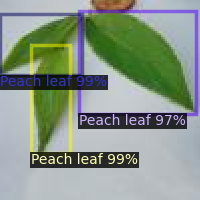

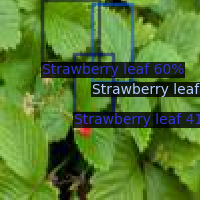

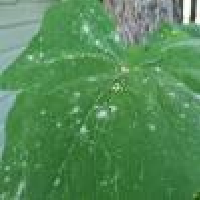

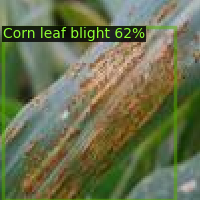

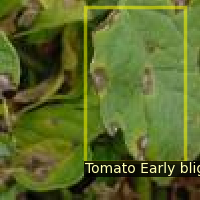

...

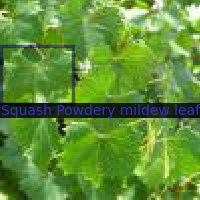

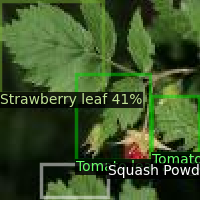

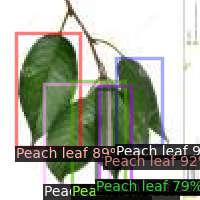

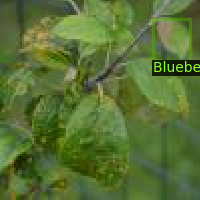

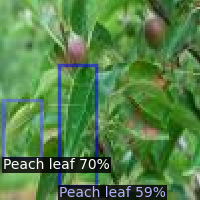

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=2
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import shutil

# Copy the folder "my_folder" to the Drive root directory recursively.
shutil.copytree("/content/output", "/content/drive/My Drive/dl1/output", True)

'/content/drive/My Drive/dl1/output'